### Import

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import holidays
import itertools

from prophet import Prophet
from prophet.plot import add_changepoints_to_plot
from prophet.diagnostics import cross_validation
from prophet.diagnostics import performance_metrics

/opt/homebrew/anaconda3/envs/LG/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


### Data

In [2]:
train = pd.read_csv('/Users/haylee/Desktop/Desktop/LG_Aimers/해커톤/open/train.csv')
train_m = train.melt(id_vars=['ID', '제품', '대분류', '중분류', '소분류', '브랜드'],
                var_name='ds', value_name='y', ignore_index=True)

### 함수 정의

In [3]:
def train_test_split(train_s, date :str):

    val_s = train_s[train_s.ds >= date]
    train_s = train_s[train_s.ds < date]
    
    train_s['ds'] = pd.to_datetime(train_s['ds'])
    val_s['ds'] = pd.to_datetime(val_s['ds'])

    return train_s, val_s

In [4]:
def make_model():
    
    m = Prophet()
    
    m.add_seasonality(name='yearly', period=365.25, fourier_order=10, prior_scale=10, mode='additive')
    m.add_seasonality(name='monthly', period=30.5, fourier_order=5, prior_scale=10, mode='additive')
    m.add_seasonality(name='weekly', period=7, fourier_order=3, prior_scale=10, mode='additive')
    
    return m

In [5]:
def mae():
    
    t = (forecast[forecast.ds >= '2023-01-01']
         .loc[:, ['ds', 'yhat']]
         .merge(val_s)
    )

    t['yhat'] = t.apply(lambda x: x.yhat -2, axis=1)
    t['se'] = np.abs(t.yhat - t.y)
    
    return t['se'].mean()

In [6]:
def plot_forecast():
    
    t = (forecast
        .loc[:, ['ds', 'yhat']]
        .merge(train_s)
    )
    
    t['yhat'] = t.apply(lambda x: x.yhat -2, axis=1)
    t['se'] = np.abs(t.yhat - t.y)

    plt.scatter(t['ds'], t['y'], s=10)
    plt.scatter(t['ds'], t['yhat'], s=10)

### Prophet simple model - test

In [7]:
list_tmp_df = []

/var/folders/2z/r9xljyt96_z0gyfcst5dz1lw0000gn/T/ipykernel_37621/4250148939.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_s['ds'] = pd.to_datetime(train_s['ds'])
/var/folders/2z/r9xljyt96_z0gyfcst5dz1lw0000gn/T/ipykernel_37621/4250148939.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  val_s['ds'] = pd.to_datetime(val_s['ds'])
20:39:45 - cmdstanpy - INFO - Chain [1] start processing
20:39:45 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/2z/r9xljyt96_z0gyfcst5dz1lw0000gn/T/ipyker

,459,460,461,462,463,464,465,466,467,468,...,470,471,472,473,474,475,476,477,478,479
0,3,3,2,2,2,2,2,3,3,3,...,2,2,2,3,3,3,3,3,3,3
1,2,2,2,2,3,3,3,3,3,3,...,4,4,4,4,4,4,4,4,3,3
2,10,11,11,12,13,14,14,14,14,12,...,10,10,10,9,9,8,8,7,6,6
3,20,20,19,20,22,24,27,27,25,21,...,18,17,17,15,13,11,12,11,10,8
4,10,9,9,7,6,6,8,8,9,10,...,11,11,13,13,13,13,10,8,6,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15885,27,29,32,30,33,27,22,23,29,36,...,48,44,37,34,36,40,39,41,33,24
15886,3,4,4,4,3,2,2,2,3,3,...,3,3,3,4,4,4,3,3,2,2
15887,17,18,19,19,19,18,17,16,16,16,...,15,15,14,13,13,12,11,10,9,8
15888,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,1,0,0


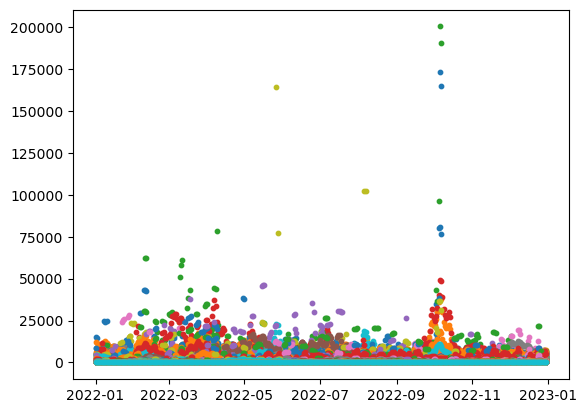

In [8]:
# ID_list 내의 ID 순서대로 반복문 실행
for i in range(0, 15890):
    # ID에 해당하는 데이터프레임에서 필요한 컬럼만 가져오기
    train_s = train_m.loc[train_m['ID'] == i].loc[:, ['ds', 'y']]

    # train, validation 데이터 분리하기
    train_s, val_s = train_test_split(train_s, '2023-01-01')

    # 모델 생성, 학습
    m = make_model()
    # m.fit(train_s)
    if train_s.shape[0] > 2:
        m.fit(train_s)
    else:
        pass

    # 모델 예측값 생성하기
    future = m.make_future_dataframe(periods=115)   
    forecast = m.predict(future)

    # 예측값이 생성된 forecast에 0이하인 값은 0으로 대체하기
    forecast.yhat = np.where(forecast.yhat < 0, 0, forecast.yhat)

    # mae, plot 확인하기
    metric = mae()
    plot_forecast()

    # 데이터프레임 형식으로 concat하기
    df = forecast[forecast.ds >= '2023-04-05'].loc[:, ['ds', 'yhat']].T
    df = df.drop(df.index[0])
    df = df.round(0).astype(int)
    list_tmp_df.append(df)

predict_df = pd.concat(list_tmp_df, ignore_index=True)
predict_df
    

In [9]:
# concat 데이터 csv파일로 저장하기
predict_df.to_csv('/Users/haylee/Desktop/Desktop/LG_Aimers/해커톤/제출파일/submission.csv', header=True, index=False)